# Lab 6 - Recurrent Neural Networks

## Problems: (Geron, 15.10)

<img width = 800 src = http://www.bach-chorales.com/Images/ChoraleImages/Image_BWV_0133_6.jpg>

Download the [Bach chorales dataset](https://homl.info/bach) and unzip it. It is composed of 382 chorales composed by Johann Sebastian Bach. Each chorale is 100 to 640 time steps long, and each time step contains 4 integers, where each integer corresponds to a note’s index on a piano (except for the value 0, which means that no note is played).

Train a model — recurrent, convolutional, or both — that can predict the next time step (four notes), given a sequence of time steps from a chorale. Then use this model to generate Bach-like music, one note at a time: you can do this by giving the model the start of a chorale and asking it to predict the next time step, then appending these time steps to the input sequence and asking the model for the next note, and so on. Also make sure to check out [Google’s Coconet model](https://magenta.tensorflow.org/coconet), which was used for a nice Google doodle about Bach.

#### Further information

At each time step, each chorales has 4 notes. Looking at the CSV for one of  the files we see that the columns are __note0__, __note1__, __note2__ and __note3__, with each row corresponding to a timestep. Each of the numbers corresponds to a piano key. 

Python can construct audio and Jupyter can play it in a Jupyter widget:

In [3]:
from keras.models import Sequential
from keras.layers import Dense, Activation
from keras.layers import LSTM
from keras.optimizers import RMSprop
from keras.optimizers import Adam
from keras.callbacks import LambdaCallback, ModelCheckpoint

In [4]:
from IPython.display import Audio
import numpy as np
import pandas as pd

signal = np.random.random(750)
print(signal[0:10])
Audio(signal, rate=250)

[0.7058287  0.2319138  0.06111614 0.99069169 0.73156917 0.01002039
 0.91989799 0.61950788 0.83308705 0.17524283]


The audio is then constructed by a simple sum of sine functions. I've uploaded in index between the note position and the keys taken from Wikipeidia (https://en.wikipedia.org/wiki/Piano_key_frequencies).

In [5]:
piano_path = "https://raw.githubusercontent.com/tipthederiver/Math-7243-2020/master/Labs/Lab%206/Piano%20Notes.csv"
notes = pd.read_csv(piano_path, encoding= 'unicode_escape')
notes #钢琴键总共有108个键。按照频率大小（单位赫兹）给每个音标上了序号

,Note,Frequency (Hz),Wavelength (cm),Key Position
0,C0,16.35,2109.89,1
1,C#0/Db0,17.32,1991.47,2
2,D0,18.35,1879.69,3
3,D#0/Eb0,19.45,1774.20,4
4,E0,20.60,1674.62,5
...,...,...,...,...
103,G8,6271.93,5.50,104
104,G#8/Ab8,6644.88,5.19,105
105,A8,7040.00,4.90,106
106,A#8/Bb8,7458.62,4.63,107


We can then get the frequency from the key position by

In [6]:
notes[notes["Key Position"]==1] #可以根据键的序号查找频率赫兹

,Note,Frequency (Hz),Wavelength (cm),Key Position
0,C0,16.35,2109.89,1


The function below will take a sequence of notes and turn it into audio.

In [7]:
#下面这个函数让谱子变成音频
def gen_audio(song, notes, framerate=22050, L=.25):
    framerate = 22050  ## Standard Framerate 帧速率
    N = len(song) # Number of Notes
    L = .25        # Note Length in Seconds
    W = int(framerate*L) # Window Size
    t = np.linspace(0,L,W) #numpy.linspace是用于创建一个一维数组，并且是等差数列构成的一维数组，第一个参数表示起始点，第二个参数表示终止点，第三个参数表示数列的个数
    data = np.zeros(W*N)

    for i in range(N): 
        F = notes["Frequency (Hz)"].iloc[song[i]+1]
        data[W*i:W*(i+1)] = np.sin(2*np.pi*F*t)
        
    return data

 I've included two note snippets below. These are __note0__ and __note1__ from chorale 305:

In [8]:
song_0 = [65,65,65,65,72,72,70,70,69,69,67,67,65,65,65,65,72,72,72,72,74,74,74,74,74,74,74]
song_1 = [60,60,60,60,60,60,60,60,60,60,60,60,62,62,64,64,65,65,65,65,65,65,65,65,65,65,65]

You can generate the tunes individually:

In [9]:
data_0 = gen_audio(song_0, notes)
Audio(data_0,rate=22050)

or to hear them together, simply add the sine-wave representation:

In [10]:
data_0 = gen_audio(song_0, notes)
data_1 = gen_audio(song_1, notes)
Audio(data_0 + data_1,rate=22050)

#### Rough Outline: 

This entire project can be completed without ever listening to the audio files and instead just treating the sequences as sequences. Your pattern should roughly be the text generator above, although now at each time step we have 4 notes, not a single letter. A rough outline is as follows:

* Load a single chorale using Panda's `read_csv` function.
* Construct the training data as we did for the text generator: the `X_train` will be sequences of $K$ timesteps, each time step containing the 4 notes. It is your choice if you leave them as integers of one-hot encode the notes. 
* The labels `y_train` will be sequences of length $K$ timesteps shifted by 1.
* Construct a simple RNN model with 64 LSTM nodes. Your input and output shape will be $K\times 4$ if you do not one-hot encode and $K\times 4\times 108$ if you do one-hot encode.
* After your get your network running on one chorale, expand your dataset by adding sequences from other chorales. 

基本大纲：
	1. 首先下载巴赫的交响曲。
	2. 用第一首来做练习。定义一个音乐方程，数字转化成音乐让python演奏出来。这里用的是钢琴的108键
	3. SEQ_LEN代表周期长度，在LSTM 里面 一周期的输出会变成输入继续训练。这里预测8个音后的下一个音是什么
	4. 定义训练集和测试集，然后做one hot encode， 每组4个note， 每个note有108个键，也就是107 个0和一个1
	5. 训练网络
	这我用两种方式训练网络
	v 4个note分开训练
	也就是每一个声部做一个列表单独训练，所以训练集的输入维度是(batch, SEQ_LEN, 108) ，输出是(batch,108) 
	（也可以所有单独训练的数据组合起来，变成一个一长串的数据训练）
	模型第一层：
	model.add(LSTM(128, return_sequences=True, input_shape = (SEQ_LEN,108))) 
	LSTM 的输入一般是3D
	如果return_sequences=True输出 是3D， 如果return_sequences=False 输出是2D 
	这里我们最后是需要2D的输出，所以之后要再加一层LSTM 并且让return_sequences=False 
	训练成功后再每个声部分开
	v 4个note 不分开训练（标准做法）
	训练集输入维度是(batch，SEQ_LEN, 4, 108）， 输出是（batch, 4,108) 
	注意：这里输入变成了4D 是不可以用LSTM 模型的，所以在训练之前，我们需要把输入转化成3d，
	可以用reshape函数，把输入的维度变成（batch,4,SEQ_LEN*108) 
	输出还是(batch,4,108) 
	模型的第一层就应该是
	model2.add(LSTM(128, return_sequences=True, input_shape = (4,SEQ_LEN*108)))
	输出要3D 

训练结束后，要把输出的one hot encode转化成数字，所以我们需要定义一个函数，在108个数中找到最大的值所对应的位置系数，这就是钢琴键的数字，之后用之前的函数让python把数字转化成音乐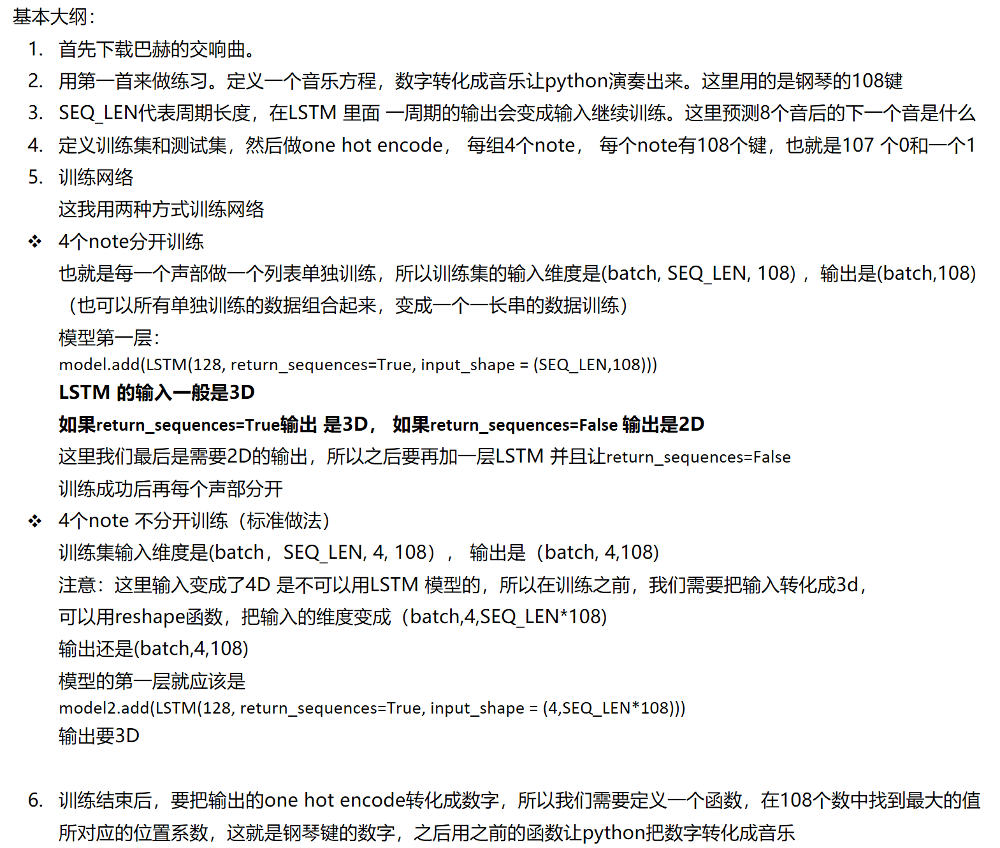

In [26]:
#Load a single chorale using Panda's read_csv function.
path = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/train/chorale_000.csv'
chorale000=pd.read_csv(path)
display(chorale000.head(16))
print(chorale000.shape)

,note0,note1,note2,note3
0,74,70,65,58
1,74,70,65,58
2,74,70,65,58
3,74,70,65,58
4,75,70,58,55
5,75,70,58,55
6,75,70,60,55
7,75,70,60,55
8,77,69,62,50
9,77,69,62,50


(192, 4)


In [27]:
#play the music 
c0 = pd.DataFrame(chorale000)
bach0 = gen_audio(c0['note0'],notes)
bach1 = gen_audio(c0['note1'],notes)
bach2=gen_audio(c0['note2'],notes)
bach3=gen_audio(c0['note3'],notes)

Audio(bach0+bach1+bach2+bach3,rate=22050)

In [28]:
#4个和声分开训练

SEQ_LEN = 8 #以八分音符为一拍

N_key = chorale000.shape[0]
C0 = np.array(c0)
x0_train = C0[0:-SEQ_LEN,0].reshape(-1,1)
x1_train = C0[0:-SEQ_LEN,1].reshape(-1,1)
x2_train = C0[0:-SEQ_LEN,2].reshape(-1,1)
x3_train = C0[0:-SEQ_LEN,3].reshape(-1,1)
for i in range(1,SEQ_LEN):
    x0_train = np.append(x0_train,C0[i:-SEQ_LEN+i,0].reshape(-1,1),axis = 1)
    x1_train = np.append(x1_train,C0[i:-SEQ_LEN+i,1].reshape(-1,1),axis = 1)
    x2_train = np.append(x2_train,C0[i:-SEQ_LEN+i,2].reshape(-1,1),axis = 1)
    x3_train = np.append(x3_train,C0[i:-SEQ_LEN+i,3].reshape(-1,1),axis = 1)

y0_train = C0[SEQ_LEN-1:-1,0]  
y1_train = C0[SEQ_LEN-1:-1,1]
y2_train = C0[SEQ_LEN-1:-1,2]
y3_train = C0[SEQ_LEN-1:-1,3]

print("x_train shape", x0_train.shape)    
print('y_train shape',y0_train.shape)

 

x_train shape (184, 8)
y_train shape (184,)


In [29]:
#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x0 = np.zeros((x0_train.shape[0],SEQ_LEN,108))
for r in range(0,x0_train.shape[0]):
    for c in range(0,SEQ_LEN):
        value = x0_train[r,c]
        x0[r,c,value] = 1
display(x0.shape)
        
#DO the one hot encode for output too
y0 = np.zeros((y0_train.shape[0],108))
for i in range(0,y0_train.shape[0]):
    value =y0_train[i]
    y0[i,value] = 1

print('the shape of input',x0.shape)
print('the shape of output',y0.shape)

(184, 8, 108)

the shape of input (184, 8, 108)
the shape of output (184, 108)


In [30]:
from keras.models import Sequential
from keras.layers import Dense, Embedding, Dropout, LSTM, Flatten
from keras.optimizers import RMSprop
from keras.optimizers import Adam
from keras.callbacks import LambdaCallback, ModelCheckpoint

model= Sequential()

model.add(LSTM(64, return_sequences=True, input_shape = (SEQ_LEN,108)))
model.add(Dropout(0.3))
model.add(LSTM(64,return_sequences = True))
model.add(Dropout(0.2))
model.add(LSTM(32,return_sequences = False))
model.add(Dropout(0.3))
model.add(Dense(108))
model.add(Activation('softmax'))


optimizer = Adam()
model.compile(loss='categorical_crossentropy', optimizer=optimizer,metrics=['accuracy'])

model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 8, 64)             44288     
_________________________________________________________________
dropout_4 (Dropout)          (None, 8, 64)             0         
_________________________________________________________________
lstm_5 (LSTM)                (None, 8, 64)             33024     
_________________________________________________________________
dropout_5 (Dropout)          (None, 8, 64)             0         
_________________________________________________________________
lstm_6 (LSTM)                (None, 32)                12416     
_________________________________________________________________
dropout_6 (Dropout)          (None, 32)                0         
_________________________________________________________________
dense_2 (Dense)              (None, 108)              

In [31]:
#Train the network
epochs = 5
history = model.fit(x0, y0,
          batch_size=64,
          epochs=epochs,
          verbose=1) 



Epoch 1/5
184/184 [==============================] - 1s 7ms/step - loss: 4.6761 - accuracy: 0.0543
Epoch 2/5
184/184 [==============================] - 0s 472us/step - loss: 4.6511 - accuracy: 0.2120
Epoch 3/5
184/184 [==============================] - 0s 348us/step - loss: 4.6223 - accuracy: 0.2772
Epoch 4/5
184/184 [==============================] - 0s 370us/step - loss: 4.5812 - accuracy: 0.2880
Epoch 5/5
184/184 [==============================] - 0s 348us/step - loss: 4.5127 - accuracy: 0.2826


In [32]:
#把四部分组合起来
#首先把其他部分做one hot encode 
x1 = np.zeros((x1_train.shape[0],SEQ_LEN,108))
for r in range(0,x1_train.shape[0]):
    for c in range(0,8):
        value = x1_train[r,c]
        x1[r,c,value] = 1

x2 = np.zeros((x2_train.shape[0],SEQ_LEN,108))
for r in range(0,x2_train.shape[0]):
    for c in range(0,8):
        value = x2_train[r,c]
        x2[r,c,value] = 1
        
x3 = np.zeros((x3_train.shape[0],SEQ_LEN,108))
for r in range(0,x3_train.shape[0]):
    for c in range(0,8):
        value = x3_train[r,c]
        x3[r,c,value] = 1

#DO the one hot encode for output too
y1 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y1_train[i]
    y1[i,value] = 1   
y2 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y2_train[i]
    y2[i,value] = 1     
y3 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y3_train[i]
    y3[i,value] = 1 
    
print('x1 shape', x1.shape)
print('x2 shape', x2.shape)
print('x3 shape', x3.shape)
print('y1 shape', y1.shape)
print('y2 shape', y2.shape)
print('y3 shape', y3.shape)

#组合所有的部分
x = np.concatenate((x0,x1,x2,x3),axis = 0)
y = np.concatenate((y0,y1,y2,y3), axis = 0)
print('x shape', x.shape)
print('y shape', y.shape)

x1 shape (184, 8, 108)
x2 shape (184, 8, 108)
x3 shape (184, 8, 108)
y1 shape (184, 108)
y2 shape (184, 108)
y3 shape (184, 108)
x shape (736, 8, 108)
y shape (736, 108)


In [34]:
from sklearn.model_selection import train_test_split
#split the training and testing set 
X_train, X_test, y_train, y_test = train_test_split(x,y,test_size = 0.2, random_state = 42)
# train the network again with all combined values 
epochs = 200
history0 = model.fit(X_train, y_train,
          batch_size=32,
          epochs=epochs,
        validation_data = (X_test, y_test),
          verbose=1) 


Train on 588 samples, validate on 148 samples
Epoch 1/200
588/588 [==============================] - 0s 614us/step - loss: 0.9554 - accuracy: 0.7415 - val_loss: 0.8693 - val_accuracy: 0.8108
Epoch 2/200
588/588 [==============================] - 0s 541us/step - loss: 0.9525 - accuracy: 0.7245 - val_loss: 0.8533 - val_accuracy: 0.7838
Epoch 3/200
588/588 [==============================] - 0s 502us/step - loss: 0.9356 - accuracy: 0.7551 - val_loss: 0.8321 - val_accuracy: 0.8041
Epoch 4/200
588/588 [==============================] - 0s 526us/step - loss: 0.9079 - accuracy: 0.7636 - val_loss: 0.8152 - val_accuracy: 0.7973
Epoch 5/200
588/588 [==============================] - 0s 519us/step - loss: 0.8972 - accuracy: 0.7670 - val_loss: 0.7974 - val_accuracy: 0.8243
Epoch 6/200
588/588 [==============================] - 0s 534us/step - loss: 0.8799 - accuracy: 0.7806 - val_loss: 0.7803 - val_accuracy: 0.8108
Epoch 7/200
588/588 [==============================] - 0s 589us/step - loss: 0.8616 

Epoch 57/200
588/588 [==============================] - 0s 494us/step - loss: 0.2717 - accuracy: 0.9541 - val_loss: 0.2404 - val_accuracy: 0.9595
Epoch 58/200
588/588 [==============================] - 0s 522us/step - loss: 0.2598 - accuracy: 0.9626 - val_loss: 0.2172 - val_accuracy: 0.9527
Epoch 59/200
588/588 [==============================] - 0s 463us/step - loss: 0.2597 - accuracy: 0.9524 - val_loss: 0.2257 - val_accuracy: 0.9527
Epoch 60/200
588/588 [==============================] - 0s 470us/step - loss: 0.2483 - accuracy: 0.9575 - val_loss: 0.2209 - val_accuracy: 0.9595
Epoch 61/200
588/588 [==============================] - 0s 502us/step - loss: 0.2524 - accuracy: 0.9541 - val_loss: 0.2263 - val_accuracy: 0.9527
Epoch 62/200
588/588 [==============================] - 0s 489us/step - loss: 0.2321 - accuracy: 0.9677 - val_loss: 0.2174 - val_accuracy: 0.9595
Epoch 63/200
588/588 [==============================] - 0s 511us/step - loss: 0.2434 - accuracy: 0.9609 - val_loss: 0.2221 -

Epoch 113/200
588/588 [==============================] - 0s 472us/step - loss: 0.1064 - accuracy: 0.9932 - val_loss: 0.1401 - val_accuracy: 0.9730
Epoch 114/200
588/588 [==============================] - 0s 511us/step - loss: 0.1194 - accuracy: 0.9813 - val_loss: 0.1332 - val_accuracy: 0.9730
Epoch 115/200
588/588 [==============================] - 0s 471us/step - loss: 0.1021 - accuracy: 0.9915 - val_loss: 0.1291 - val_accuracy: 0.9730
Epoch 116/200
588/588 [==============================] - 0s 467us/step - loss: 0.1033 - accuracy: 0.9915 - val_loss: 0.1259 - val_accuracy: 0.9797
Epoch 117/200
588/588 [==============================] - 0s 592us/step - loss: 0.1016 - accuracy: 0.9949 - val_loss: 0.1276 - val_accuracy: 0.9797
Epoch 118/200
588/588 [==============================] - 0s 658us/step - loss: 0.0954 - accuracy: 0.9966 - val_loss: 0.1241 - val_accuracy: 0.9730
Epoch 119/200
588/588 [==============================] - 0s 643us/step - loss: 0.0925 - accuracy: 0.9932 - val_loss: 0

Epoch 169/200
588/588 [==============================] - 0s 599us/step - loss: 0.0512 - accuracy: 0.9966 - val_loss: 0.0986 - val_accuracy: 0.9797
Epoch 170/200
588/588 [==============================] - 0s 607us/step - loss: 0.0556 - accuracy: 0.9966 - val_loss: 0.1069 - val_accuracy: 0.9865
Epoch 171/200
588/588 [==============================] - 0s 600us/step - loss: 0.0456 - accuracy: 1.0000 - val_loss: 0.1149 - val_accuracy: 0.9797
Epoch 172/200
588/588 [==============================] - 0s 610us/step - loss: 0.0483 - accuracy: 0.9966 - val_loss: 0.1113 - val_accuracy: 0.9797
Epoch 173/200
588/588 [==============================] - 0s 621us/step - loss: 0.0448 - accuracy: 0.9949 - val_loss: 0.1065 - val_accuracy: 0.9797
Epoch 174/200
588/588 [==============================] - 0s 705us/step - loss: 0.0469 - accuracy: 0.9966 - val_loss: 0.1095 - val_accuracy: 0.9797
Epoch 175/200
588/588 [==============================] - 0s 551us/step - loss: 0.0499 - accuracy: 0.9966 - val_loss: 0

In [35]:
#拿一组数据随便测试一下
#Demostrate the prediction
sample = X_test
y_predict = model.predict(sample)

#define a function to get the note. The value should be the position of maximum output 
def getnote(l):
    # find the index of the max
    note = l.index(max(l))
    return int(note)

#transfer a numpy into lists 
y_note = y_predict.tolist()

#Get the notes for each list in y_note
sample_note = []
for l in y_note:
    sample_note.append(getnote(l))



#play the music 
sample_music = gen_audio(sample_note[30:100],notes)
Audio(sample_music,rate=22050)

In [36]:
#试着做一个四组和弦
sample0 = x0[10:100,:,:]
sample1 = x1[10:100,:,:]
sample2 = x2[10:100,:,:]
sample3 = x3[10:100,:,:]
y0_predict = model.predict(sample0)
y1_predict = model.predict(sample1)
y2_predict = model.predict(sample2)
y3_predict = model.predict(sample3)

#transfer a numpy into lists 
y0_note = y0_predict.tolist()
y1_note = y1_predict.tolist()
y2_note = y2_predict.tolist()
y3_note = y3_predict.tolist()

#Get the notes for each list in y_note
sample0_note = []
sample1_note = []
sample2_note = []
sample3_note = []
for l in y0_note:
    sample0_note.append(getnote(l))
for l in y1_note:
    sample1_note.append(getnote(l))
for l in y2_note:
    sample2_note.append(getnote(l))
for l in y3_note:
    sample3_note.append(getnote(l))

    
#play the music 
sample0_music = gen_audio(sample0_note,notes)
sample1_music = gen_audio(sample1_note,notes)
sample2_music = gen_audio(sample2_note,notes)
sample3_music = gen_audio(sample3_note,notes)
Audio(sample0_music+sample1_music+sample2_music+sample3_music,rate=22050)

In [41]:
#接下来导入更多的数据

#The model above only fit the data in one file chorale_000.csv
 
#Now we are going to load more files with more data 

#Load more chorale files from train folder
path_train = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/train/'
path_test = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/test/'
path_valid = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/valid/'

import glob
import pandas as pd

#分别导入训练集，测试集和验证集
data_train = pd.DataFrame()
for file_name in glob.glob(path_train +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_train = pd.concat([data_train,x],axis=0)

data_test = pd.DataFrame()
for file_name in glob.glob(path_test +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_test = pd.concat([data_test,x],axis=0)   
    
data_valid = pd.DataFrame()
for file_name in glob.glob(path_valid +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_valid = pd.concat([data_valid,x],axis=0)    
        
    
display(data_train.shape)
display(data_train.head(8))


(55228, 4)

,note0,note1,note2,note3
0,74,70,65,58
1,74,70,65,58
2,74,70,65,58
3,74,70,65,58
4,75,70,58,55
5,75,70,58,55
6,75,70,60,55
7,75,70,60,55


In [38]:
#4个和声分开训练

SEQ_LEN = 8 #以八分音符为一拍

N_key = data.shape[0]
C0 = np.array(data[0:10000])
x0_train = C0[0:-SEQ_LEN,0].reshape(-1,1)
x1_train = C0[0:-SEQ_LEN,1].reshape(-1,1)
x2_train = C0[0:-SEQ_LEN,2].reshape(-1,1)
x3_train = C0[0:-SEQ_LEN,3].reshape(-1,1)
for i in range(1,SEQ_LEN):
    x0_train = np.append(x0_train,C0[i:-SEQ_LEN+i,0].reshape(-1,1),axis = 1)
    x1_train = np.append(x1_train,C0[i:-SEQ_LEN+i,1].reshape(-1,1),axis = 1)
    x2_train = np.append(x2_train,C0[i:-SEQ_LEN+i,2].reshape(-1,1),axis = 1)
    x3_train = np.append(x3_train,C0[i:-SEQ_LEN+i,3].reshape(-1,1),axis = 1)

y0_train = C0[SEQ_LEN-1:-1,0]  
y1_train = C0[SEQ_LEN-1:-1,1]
y2_train = C0[SEQ_LEN-1:-1,2]
y3_train = C0[SEQ_LEN-1:-1,3]

print("x_train shape", x0_train.shape)    
print('y_train shape',y0_train.shape)

#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x0 = np.zeros((x0_train.shape[0],SEQ_LEN,108))
for r in range(0,x0_train.shape[0]):
    for c in range(0,SEQ_LEN):
        value = x0_train[r,c]
        x0[r,c,value] = 1
display(x0.shape)
        
#DO the one hot encode for output too
y0 = np.zeros((y0_train.shape[0],108))
for i in range(0,y0_train.shape[0]):
    value =y0_train[i]
    y0[i,value] = 1

#把四部分组合起来
#首先把其他部分做one hot encode 
x1 = np.zeros((x1_train.shape[0],SEQ_LEN,108))
for r in range(0,x1_train.shape[0]):
    for c in range(0,8):
        value = x1_train[r,c]
        x1[r,c,value] = 1

x2 = np.zeros((x2_train.shape[0],SEQ_LEN,108))
for r in range(0,x2_train.shape[0]):
    for c in range(0,8):
        value = x2_train[r,c]
        x2[r,c,value] = 1
        
x3 = np.zeros((x3_train.shape[0],SEQ_LEN,108))
for r in range(0,x3_train.shape[0]):
    for c in range(0,8):
        value = x3_train[r,c]
        x3[r,c,value] = 1

#DO the one hot encode for output too
y1 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y1_train[i]
    y1[i,value] = 1   
y2 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y2_train[i]
    y2[i,value] = 1     
y3 = np.zeros((y0_train.shape[0],108))
for i in range(0,184):
    value =y3_train[i]
    y3[i,value] = 1 
    
print('x1 shape', x1.shape)
print('x2 shape', x2.shape)
print('x3 shape', x3.shape)
print('y1 shape', y1.shape)
print('y2 shape', y2.shape)
print('y3 shape', y3.shape)

#组合所有的部分
x_bach = np.concatenate((x0,x1,x2,x3),axis = 0)
y_bach = np.concatenate((y0,y1,y2,y3), axis = 0)
print('x shape', x_bach.shape)
print('y shape', y_bach.shape)

x_train shape (9992, 8)
y_train shape (9992,)


(9992, 8, 108)

x1 shape (9992, 8, 108)
x2 shape (9992, 8, 108)
x3 shape (9992, 8, 108)
y1 shape (9992, 108)
y2 shape (9992, 108)
y3 shape (9992, 108)
x shape (39968, 8, 108)
y shape (39968, 108)


In [40]:
from sklearn.model_selection import train_test_split
#split the training and testing set 
X_train, X_test, y_train, y_test = train_test_split(x_bach,y_bach,test_size = 0.2, random_state = 42)
# train the network again with all combined values 
epochs = 100
history1 = model.fit(X_train, y_train,
          batch_size=32,
          epochs=epochs,
        validation_data = (X_test, y_test),
          verbose=1) 


Train on 31974 samples, validate on 7994 samples
Epoch 1/100
31974/31974 [==============================] - 16s 496us/step - loss: 0.5532 - accuracy: 0.1244 - val_loss: 0.4691 - val_accuracy: 0.1479
Epoch 2/100
31974/31974 [==============================] - 19s 594us/step - loss: 0.5636 - accuracy: 0.1218 - val_loss: 0.4066 - val_accuracy: 0.1609
Epoch 3/100
31974/31974 [==============================] - 19s 609us/step - loss: 0.5436 - accuracy: 0.1224 - val_loss: 0.4296 - val_accuracy: 0.1504
Epoch 4/100
31974/31974 [==============================] - 18s 553us/step - loss: 0.5365 - accuracy: 0.1210 - val_loss: 0.4279 - val_accuracy: 0.1485
Epoch 5/100
31974/31974 [==============================] - 16s 501us/step - loss: 0.5203 - accuracy: 0.1226 - val_loss: 0.4274 - val_accuracy: 0.1535
Epoch 6/100
31974/31974 [==============================] - 15s 477us/step - loss: 0.5333 - accuracy: 0.1175 - val_loss: 0.4327 - val_accuracy: 0.1479
Epoch 7/100
31974/31974 [==========================

KeyboardInterrupt: 

In [64]:
#试着做一个四组和弦
sample0 = x0[10:100,:,:]
sample1 = x1[10:100,:,:]
sample2 = x2[10:100,:,:]
sample3 = x3[10:100,:,:]
y0_predict = model.predict(sample0)
y1_predict = model.predict(sample1)
y2_predict = model.predict(sample2)
y3_predict = model.predict(sample3)

#transfer a numpy into lists 
y0_note = y0_predict.tolist()
y1_note = y1_predict.tolist()
y2_note = y2_predict.tolist()
y3_note = y3_predict.tolist()

#Get the notes for each list in y_note
sample0_note = []
sample1_note = []
sample2_note = []
sample3_note = []
for l in y0_note:
    sample0_note.append(getnote(l))
for l in y1_note:
    sample1_note.append(getnote(l))
for l in y2_note:
    sample2_note.append(getnote(l))
for l in y3_note:
    sample3_note.append(getnote(l))

    
#play the music 
sample0_music = gen_audio(sample0_note,notes)
sample1_music = gen_audio(sample1_note,notes)
sample2_music = gen_audio(sample2_note,notes)
sample3_music = gen_audio(sample3_note,notes)
Audio(sample0_music+sample1_music+sample2_music+sample3_music,rate=22050)

In [70]:
#想做另一个网络，4个和弦一起训练的那种

#重新定义训练集和测试集，还是那之前的第一个文件做例子
#Load a single chorale using Panda's read_csv function.
path = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/train/chorale_000.csv'
chorale000=pd.read_csv(path)
c0 = pd.DataFrame(chorale000)
print('chorale000 shape', c0.shape)

SEQ_LEN = 8 #以八分音符为一拍


C0 = np.array(c0)
x4_train = C0[0:-SEQ_LEN,:].reshape(-1,1,4)

for i in range(1,SEQ_LEN):
    x4_train = np.append(x4_train,C0[i:-SEQ_LEN+i,:].reshape(-1,1,4),axis = 1)
   
y4_train = C0[SEQ_LEN-1:-1,:]


print("x4_train shape", x4_train.shape)    
print('y4_train shape',y4_train.shape)


#做one hot encode 
#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x4 = np.zeros((x4_train.shape[0],SEQ_LEN,4,108))
for r in range(0,x4_train.shape[0]):
    for c in range(0,SEQ_LEN):
        for n in range(0,4):
            value = x4_train[r,c,n]
            x4[r,c,n,value] = 1

        
#DO the one hot encode for output too
y4 = np.zeros((y4_train.shape[0],4,108))
for i in range(0,y4_train.shape[0]):
    for c in range(0,4):
        value =y4_train[i,c]
        y4[i,c,value] = 1

x4=np.reshape(x4,(x4.shape[0],4,-1))  
        
print('the shape of input',x4.shape)
print('the shape of output',y4.shape)



chorale000 shape (192, 4)
x4_train shape (184, 8, 4)
y4_train shape (184, 4)
the shape of input (184, 4, 864)
the shape of output (184, 4, 108)


In [69]:

from keras.models import Sequential
from keras.layers import Dense, Embedding, Dropout, LSTM, Flatten, TimeDistributed,Activation
from keras.optimizers import RMSprop
from keras.optimizers import Adam
from keras.callbacks import LambdaCallback, ModelCheckpoint

model2= Sequential()


model2.add(LSTM(128, return_sequences=True, input_shape = (4,x4.shape[-1])))  #注意，这里的x4要改成之后用的新的x4
model2.add(Dropout(0.3))
model2.add(LSTM(128,return_sequences = True))
model2.add(Dropout(0.3))
model2.add(LSTM(64,return_sequences = True))
model2.add(Dropout(0.5))
model2.add(Dense(108))
model2.add(Activation('softmax'))


optimizer = Adam()
model2.compile(loss='categorical_crossentropy', optimizer=optimizer,metrics=['accuracy'])

model2.summary()

Model: "sequential_8"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_22 (LSTM)               (None, 4, 128)            508416    
_________________________________________________________________
dropout_22 (Dropout)         (None, 4, 128)            0         
_________________________________________________________________
lstm_23 (LSTM)               (None, 4, 128)            131584    
_________________________________________________________________
dropout_23 (Dropout)         (None, 4, 128)            0         
_________________________________________________________________
lstm_24 (LSTM)               (None, 4, 64)             49408     
_________________________________________________________________
dropout_24 (Dropout)         (None, 4, 64)             0         
_________________________________________________________________
dense_8 (Dense)              (None, 4, 108)           

In [71]:
#训练神经网络
from sklearn.model_selection import train_test_split
#split the training and testing set 
X4_train, X4_test, Y4_train, Y4_test = train_test_split(x4,y4,test_size = 0.2, random_state = 42)
# train the network again with all combined values 
epochs = 200
history3 = model2.fit(X4_train, Y4_train,
          batch_size=1,
          epochs=epochs,
        validation_data = (X4_test, Y4_test),
          verbose=1) 


Train on 147 samples, validate on 37 samples
Epoch 1/200
147/147 [==============================] - 8s 55ms/step - loss: 3.8139 - accuracy: 0.0799 - val_loss: 2.9908 - val_accuracy: 0.1419
Epoch 2/200
147/147 [==============================] - 6s 38ms/step - loss: 2.8925 - accuracy: 0.1514 - val_loss: 2.4882 - val_accuracy: 0.1689
Epoch 3/200
147/147 [==============================] - 5s 37ms/step - loss: 2.5508 - accuracy: 0.1650 - val_loss: 2.2647 - val_accuracy: 0.2297
Epoch 4/200
147/147 [==============================] - 6s 39ms/step - loss: 2.3111 - accuracy: 0.2279 - val_loss: 2.1210 - val_accuracy: 0.1959
Epoch 5/200
147/147 [==============================] - 5s 37ms/step - loss: 2.1812 - accuracy: 0.2568 - val_loss: 2.0742 - val_accuracy: 0.2500
Epoch 6/200
147/147 [==============================] - 5s 33ms/step - loss: 2.1149 - accuracy: 0.2585 - val_loss: 1.9522 - val_accuracy: 0.3311
Epoch 7/200
147/147 [==============================] - 5s 32ms/step - loss: 2.0582 - accura

147/147 [==============================] - 5s 36ms/step - loss: 0.4027 - accuracy: 0.8656 - val_loss: 1.2509 - val_accuracy: 0.7027
Epoch 58/200
147/147 [==============================] - 5s 31ms/step - loss: 0.3894 - accuracy: 0.8844 - val_loss: 1.2571 - val_accuracy: 0.6959
Epoch 59/200
147/147 [==============================] - 4s 29ms/step - loss: 0.3955 - accuracy: 0.8741 - val_loss: 1.1982 - val_accuracy: 0.6959
Epoch 60/200
147/147 [==============================] - 4s 30ms/step - loss: 0.3661 - accuracy: 0.8793 - val_loss: 1.2463 - val_accuracy: 0.6959
Epoch 61/200
147/147 [==============================] - 5s 35ms/step - loss: 0.3800 - accuracy: 0.8776 - val_loss: 1.2224 - val_accuracy: 0.7230
Epoch 62/200
147/147 [==============================] - 5s 34ms/step - loss: 0.3582 - accuracy: 0.8861 - val_loss: 1.1794 - val_accuracy: 0.7230
Epoch 63/200
147/147 [==============================] - 4s 30ms/step - loss: 0.3627 - accuracy: 0.8759 - val_loss: 1.2136 - val_accuracy: 0.709

147/147 [==============================] - 5s 35ms/step - loss: 0.2758 - accuracy: 0.9031 - val_loss: 1.5727 - val_accuracy: 0.7230
Epoch 114/200
147/147 [==============================] - 4s 30ms/step - loss: 0.2052 - accuracy: 0.9133 - val_loss: 1.5664 - val_accuracy: 0.7500
Epoch 115/200
147/147 [==============================] - 4s 29ms/step - loss: 0.2102 - accuracy: 0.9337 - val_loss: 1.6396 - val_accuracy: 0.7365
Epoch 116/200
147/147 [==============================] - 4s 29ms/step - loss: 0.2030 - accuracy: 0.9286 - val_loss: 1.6573 - val_accuracy: 0.7297
Epoch 117/200
147/147 [==============================] - 4s 30ms/step - loss: 0.1774 - accuracy: 0.9354 - val_loss: 1.6835 - val_accuracy: 0.6959
Epoch 118/200
147/147 [==============================] - 4s 30ms/step - loss: 0.1791 - accuracy: 0.9337 - val_loss: 1.6788 - val_accuracy: 0.7230
Epoch 119/200
147/147 [==============================] - 4s 29ms/step - loss: 0.2109 - accuracy: 0.9201 - val_loss: 1.7609 - val_accuracy:

147/147 [==============================] - 3s 22ms/step - loss: 0.1661 - accuracy: 0.9337 - val_loss: 1.8107 - val_accuracy: 0.7095
Epoch 170/200
147/147 [==============================] - 3s 22ms/step - loss: 0.1701 - accuracy: 0.9269 - val_loss: 1.8946 - val_accuracy: 0.7297
Epoch 171/200
147/147 [==============================] - 3s 22ms/step - loss: 0.1541 - accuracy: 0.9388 - val_loss: 1.8256 - val_accuracy: 0.7365
Epoch 172/200
147/147 [==============================] - 3s 23ms/step - loss: 0.1534 - accuracy: 0.9337 - val_loss: 1.9104 - val_accuracy: 0.7027
Epoch 173/200
147/147 [==============================] - 3s 23ms/step - loss: 0.1788 - accuracy: 0.9218 - val_loss: 1.7509 - val_accuracy: 0.7297
Epoch 174/200
147/147 [==============================] - 3s 22ms/step - loss: 0.1658 - accuracy: 0.9286 - val_loss: 1.9226 - val_accuracy: 0.7297
Epoch 175/200
147/147 [==============================] - 3s 22ms/step - loss: 0.1529 - accuracy: 0.9320 - val_loss: 1.9434 - val_accuracy:

In [72]:
#play the music 
sample4 = X4_train
y4_predict = model2.predict(sample4)

#Getnote function 
#define a function to get the note. The value should be the position of maximum output 
def getnote(l):
    # find the index of the max
    note = l.index(max(l))
    return int(note)



bach = []
for piece in range(0,y4_predict.shape[0]):
    for note in range(0,4):
        fournote = y4_predict[piece,note,:].tolist()
        bach.append(getnote(fournote))

bach = np.array(bach)
bach = np.reshape(bach,(-1,4))

bach0 =gen_audio(bach[:,0],notes)
bach1 = gen_audio(bach[:,1],notes)
bach2 = gen_audio(bach[:,2],notes)
bach3= gen_audio(bach[:,3], notes)
Audio(bach0+bach1+bach2+bach3,rate=22050)

        

In [75]:
#接下来导入更多的数据

#The model above only fit the data in one file chorale_000.csv
 
#Now we are going to load more files with more data 

#Load more chorale files from train folder
path_train = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/train/'
path_test = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/test/'
path_valid = '/Users/Mobiu/Documents/collage/2020Spring/Machine learning 1/lab6/lab6Bach/valid/'

import glob
import pandas as pd

#分别导入训练集，测试集和验证集
data_train = pd.DataFrame()
for file_name in glob.glob(path_train +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_train = pd.concat([data_train,x],axis=0)

data_test = pd.DataFrame()
for file_name in glob.glob(path_test +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_test = pd.concat([data_test,x],axis=0)   
    
data_valid = pd.DataFrame()
for file_name in glob.glob(path_valid +'*.csv'):
    x = pd.read_csv(file_name, low_memory=False)
    data_valid = pd.concat([data_valid,x],axis=0)    
        
    
SEQ_LEN = 8 #以八分音符为一拍


C0 = np.array(data_train)
x4_train = C0[0:-SEQ_LEN,:].reshape(-1,1,4)

for i in range(1,SEQ_LEN):
    x4_train = np.append(x4_train,C0[i:-SEQ_LEN+i,:].reshape(-1,1,4),axis = 1)
   
y4_train = C0[SEQ_LEN-1:-1,:]


print("x4_train shape", x4_train.shape)    
print('y4_train shape',y4_train.shape)


#做one hot encode 
#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x4 = np.zeros((x4_train.shape[0],SEQ_LEN,4,108))
for r in range(0,x4_train.shape[0]):
    for c in range(0,SEQ_LEN):
        for n in range(0,4):
            value = x4_train[r,c,n]
            x4[r,c,n,value] = 1

        
#DO the one hot encode for output too
y4 = np.zeros((y4_train.shape[0],4,108))
for i in range(0,y4_train.shape[0]):
    for c in range(0,4):
        value =y4_train[i,c]
        y4[i,c,value] = 1

x4=np.reshape(x4,(x4.shape[0],4,-1))  
        
print('the shape of input',x4.shape)
print('the shape of output',y4.shape)




x4_train shape (55220, 8, 4)
y4_train shape (55220, 4)


MemoryError: 

In [67]:
#再给测试集和验证集分别做one hot encode
C0_valid = np.array(data_valid)
SEQ_LEN = 8
x_valid = C0_valid[0:-SEQ_LEN,:].reshape(-1,1,4)

for i in range(1,SEQ_LEN):
    x_valid = np.append(x_valid,C0_valid[i:-SEQ_LEN+i,:].reshape(-1,1,4),axis = 1)
   
y_valid = C0_valid[SEQ_LEN-1:-1,:]


#做one hot encode 
#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x4_valid = np.zeros((x_valid.shape[0],SEQ_LEN,4,108))
for r in range(0,x_valid.shape[0]):
    for c in range(0,SEQ_LEN):
        for n in range(0,4):
            value = x_valid[r,c,n]
            x4_valid[r,c,n,value] = 1
            
x4_valid = np.reshape(x4_valid,(x4_valid.shape[0],4,-1))            

#DO the one hot encode for output too
y4_valid = np.zeros((y_valid.shape[0],4,108))
for i in range(0,y_valid.shape[0]):
    for c in range(0,4):
        value =y_valid[i,c]
        y4_valid[i,c,value] = 1




#测试集
C0_test = np.array(data_test)
x_test =  C0_test[0:-SEQ_LEN,:].reshape(-1,1,4)

for i in range(1,SEQ_LEN):
    x_test  = np.append(x_test ,C0_test[i:-SEQ_LEN+i,:].reshape(-1,1,4),axis = 1)
   
y_test = C0_test[SEQ_LEN-1:-1,:]



#做one hot encode 
#DO one hot encode for input, the shape should be K*4*108 where there are one value equals to 1 and 107 value equals to 0
x4_test = np.zeros((x_test.shape[0],SEQ_LEN,4,108))
for r in range(0,x_test.shape[0]):
    for c in range(0,SEQ_LEN):
        for n in range(0,4):
            value = x_test[r,c,n]
            x4_test[r,c,n,value] = 1
            
x4_test = np.reshape(x4_test,(x4_test.shape[0],4,-1))            

#DO the one hot encode for output too
y4_test = np.zeros((y_test.shape[0],4,108))
for i in range(0,y_test.shape[0]):
    for c in range(0,4):
        value =y_test[i,c]
        y4_test[i,c,value] = 1







print('x validation shape ',x4_valid.shape)
print('y validation shape',y4_valid.shape)
print('x test shape', x4_test.shape)
print('y test shape',y4_test.shape)


x validation shape  (18400, 4, 864)
y validation shape (18400, 4, 108)
x test shape (18892, 4, 864)
y test shape (18892, 4, 108)


In [68]:
#训练神经网络（用训练集，测试集和验证集训练）

epochs = 200
history4 = model2.fit(x4,y4,
          batch_size=64,
          epochs=epochs,
        validation_data = (x4_valid, y4_valid),
          verbose=1) 

Train on 55220 samples, validate on 18400 samples
Epoch 1/200
55220/55220 [==============================] - 33s 599us/step - loss: 3.4867 - accuracy: 0.1272 - val_loss: 2.3875 - val_accuracy: 0.2427
Epoch 2/200
55220/55220 [==============================] - 31s 570us/step - loss: 2.5221 - accuracy: 0.2120 - val_loss: 2.0933 - val_accuracy: 0.3300
Epoch 3/200
55220/55220 [==============================] - 30s 549us/step - loss: 2.2377 - accuracy: 0.2815 - val_loss: 1.8500 - val_accuracy: 0.3984
Epoch 4/200
55220/55220 [==============================] - 36s 644us/step - loss: 2.0192 - accuracy: 0.3489 - val_loss: 1.6618 - val_accuracy: 0.4623
Epoch 5/200
55220/55220 [==============================] - 36s 646us/step - loss: 1.8519 - accuracy: 0.4021 - val_loss: 1.5560 - val_accuracy: 0.4871
Epoch 6/200
55220/55220 [==============================] - 38s 693us/step - loss: 1.7402 - accuracy: 0.4389 - val_loss: 1.4893 - val_accuracy: 0.5071
Epoch 7/200
55220/55220 [=========================

55220/55220 [==============================] - 29s 533us/step - loss: 1.2717 - accuracy: 0.5899 - val_loss: 1.2997 - val_accuracy: 0.5828
Epoch 56/200
55220/55220 [==============================] - 26s 463us/step - loss: 1.2724 - accuracy: 0.5898 - val_loss: 1.2979 - val_accuracy: 0.5842
Epoch 57/200
55220/55220 [==============================] - 25s 460us/step - loss: 1.2690 - accuracy: 0.5909 - val_loss: 1.2976 - val_accuracy: 0.5845
Epoch 58/200
55220/55220 [==============================] - 25s 461us/step - loss: 1.2686 - accuracy: 0.5917 - val_loss: 1.2946 - val_accuracy: 0.5836
Epoch 59/200
55220/55220 [==============================] - 33s 594us/step - loss: 1.2646 - accuracy: 0.5922 - val_loss: 1.3040 - val_accuracy: 0.5827
Epoch 60/200
55220/55220 [==============================] - 33s 607us/step - loss: 1.2640 - accuracy: 0.5928 - val_loss: 1.3029 - val_accuracy: 0.5840
Epoch 61/200
55220/55220 [==============================] - 28s 502us/step - loss: 1.2618 - accuracy: 0.592

55220/55220 [==============================] - 26s 465us/step - loss: 1.1987 - accuracy: 0.6128 - val_loss: 1.3336 - val_accuracy: 0.5819
Epoch 110/200
55220/55220 [==============================] - 27s 482us/step - loss: 1.1982 - accuracy: 0.6127 - val_loss: 1.3299 - val_accuracy: 0.5833
Epoch 111/200
55220/55220 [==============================] - 35s 627us/step - loss: 1.1987 - accuracy: 0.6127 - val_loss: 1.3337 - val_accuracy: 0.5831
Epoch 112/200
55220/55220 [==============================] - 43s 778us/step - loss: 1.1978 - accuracy: 0.6135 - val_loss: 1.3310 - val_accuracy: 0.5845
Epoch 113/200
55220/55220 [==============================] - 30s 546us/step - loss: 1.1964 - accuracy: 0.6133 - val_loss: 1.3321 - val_accuracy: 0.5837
Epoch 114/200
55220/55220 [==============================] - 31s 563us/step - loss: 1.1956 - accuracy: 0.6136 - val_loss: 1.3333 - val_accuracy: 0.5826
Epoch 115/200
55220/55220 [==============================] - 32s 576us/step - loss: 1.1944 - accuracy:

KeyboardInterrupt: 

In [39]:
#play the music 
music4 = X4_train[5000:5020]
music4_predict = model2.predict(music4)

bach4 = []
for piece in range(0,music4_predict.shape[0]):
    for note in range(0,4):
        fournote = music4_predict[piece,note,:].tolist()
        bach4.append(getnote(fournote))

bach4 = np.array(bach4)
bach4 = np.reshape(bach4,(-1,4))

bach0 =gen_audio(bach4[:,0],notes)
bach1 = gen_audio(bach4[:,1],notes)
bach2 = gen_audio(bach4[:,2],notes)
bach3= gen_audio(bach4[:,3], notes)
Audio(bach0+bach1+bach2+bach3,rate=22050)